## useful links

### - 6 Types of Regression Models in Machine Learning You Should Know About
https://www.upgrad.com/blog/types-of-regression-models-in-machine-learning/

### - Linear Regression: Machine Learning in Python
https://medium.com/swlh/linear-regression-machine-learning-in-python-227f062bd07c

### - Linear Regression House price prediction
https://www.kaggle.com/faressayah/linear-regression-house-price-prediction

### - Outlier detection with Scikit Learn
https://www.mikulskibartosz.name/outlier-detection-with-scikit-learn/

In [120]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split

In [2]:
df = pd.read_excel('Dataset.xlsx')
print(df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 945 entries, 0 to 944
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID                 945 non-null    object 
 1   Country            945 non-null    object 
 2   AncientComponent1  945 non-null    float64
 3   AncientComponent2  945 non-null    float64
 4   AncientComponent3  945 non-null    float64
 5   AncientComponent4  945 non-null    float64
 6   AncientComponent5  945 non-null    float64
 7   ModernComponent1   945 non-null    float64
 8   ModernComponent2   945 non-null    float64
 9   ModernComponent3   945 non-null    float64
 10  DateBP             945 non-null    float64
dtypes: float64(9), object(2)
memory usage: 81.3+ KB
None


,ID,Country,AncientComponent1,AncientComponent2,AncientComponent3,AncientComponent4,AncientComponent5,ModernComponent1,ModernComponent2,ModernComponent3,DateBP
0,12885A,UnitedKingdom,0.005163,0.000010,0.000010,0.000010,0.000010,0.000010,0.994777,0.000010,1165.0
1,NO3423,UnitedKingdom,0.126343,0.101202,0.007385,0.089396,0.025419,0.032101,0.612849,0.005305,1170.0
2,RISE568,CzechRepublic,0.000010,0.000010,0.011371,0.067321,0.227519,0.013754,0.671613,0.008402,1200.0
3,12881A,UnitedKingdom,0.043935,0.061363,0.040180,0.051719,0.000010,0.007097,0.770237,0.025458,1232.0
4,RISE569,CzechRepublic,0.000010,0.059740,0.077413,0.042270,0.000010,0.038095,0.773653,0.008809,1235.0


In [4]:
df.iloc[:,2:-1].corr()

,AncientComponent1,AncientComponent2,AncientComponent3,AncientComponent4,AncientComponent5,ModernComponent1,ModernComponent2,ModernComponent3
AncientComponent1,1.000000,-0.418918,-0.215484,-0.398540,-0.184247,0.072790,-0.020845,-0.133594
AncientComponent2,-0.418918,1.000000,-0.057122,-0.022046,-0.073175,-0.221773,-0.333573,0.032344
AncientComponent3,-0.215484,-0.057122,1.000000,-0.163483,-0.034902,-0.157387,-0.373796,-0.038013
AncientComponent4,-0.398540,-0.022046,-0.163483,1.000000,-0.097405,-0.112599,-0.238761,-0.064444
AncientComponent5,-0.184247,-0.073175,-0.034902,-0.097405,1.000000,-0.143031,-0.223096,-0.051804
ModernComponent1,0.072790,-0.221773,-0.157387,-0.112599,-0.143031,1.000000,0.335855,0.138448
ModernComponent2,-0.020845,-0.333573,-0.373796,-0.238761,-0.223096,0.335855,1.000000,-0.022668
ModernComponent3,-0.133594,0.032344,-0.038013,-0.064444,-0.051804,0.138448,-0.022668,1.000000


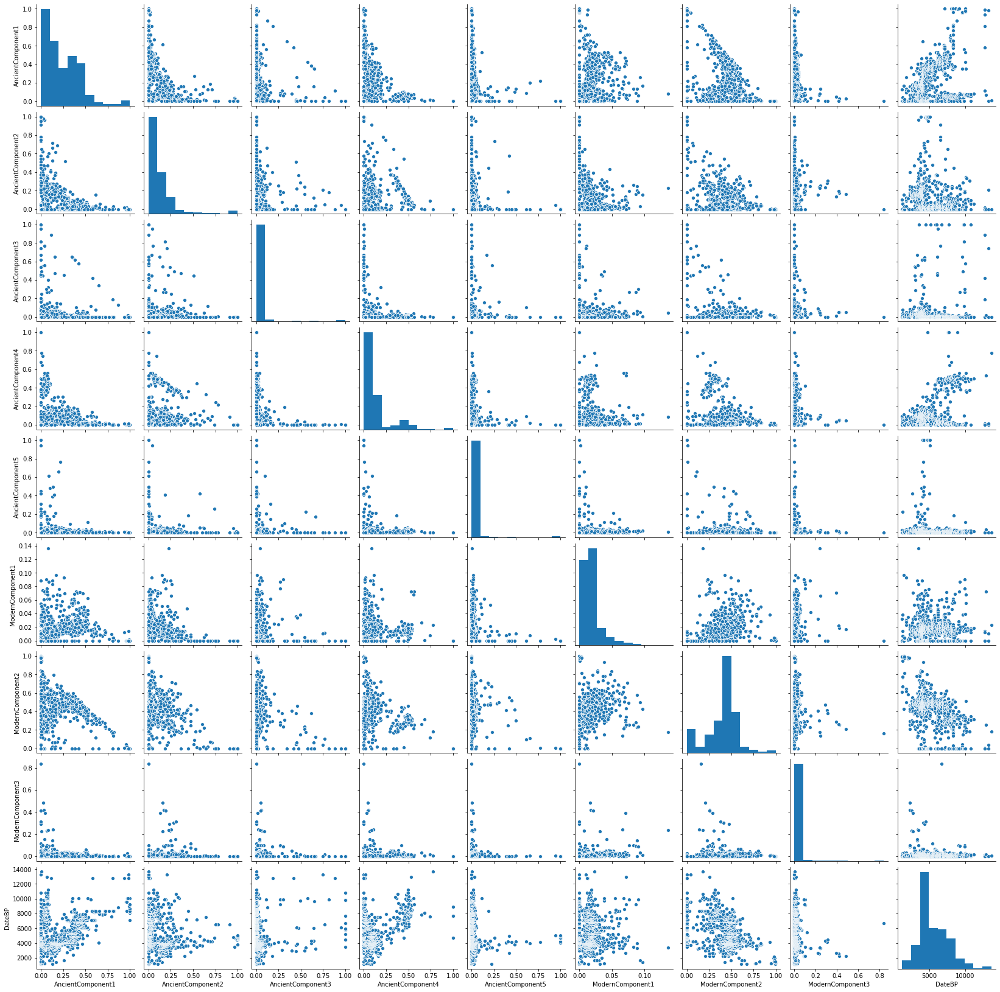

In [11]:
sns.pairplot(df.iloc[:,2:])

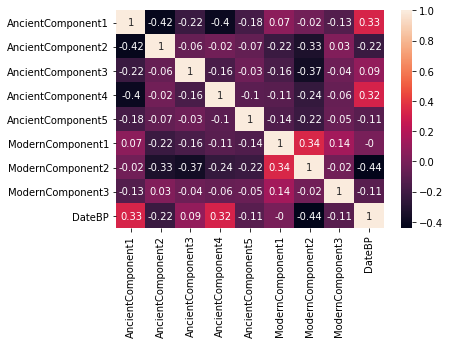

In [12]:
corr = df.corr().round(2)
sns.heatmap(data=corr,annot=True)
plt.show()

# Data Pre-Processing

In [13]:
# Checking na values
df.isna().sum()

ID                   0
Country              0
AncientComponent1    0
AncientComponent2    0
AncientComponent3    0
AncientComponent4    0
AncientComponent5    0
ModernComponent1     0
ModernComponent2     0
ModernComponent3     0
DateBP               0
dtype: int64

In [48]:
X = df.iloc[:,2:-1].values
y = df['DateBP'].values

# 1. Linear Regression

In [40]:
# Model initialization
regression_model = LinearRegression()
# Fit the data(train the model)
regression_model.fit(X,y)
# Predict
y_predicted = regression_model.predict(X)

# model evaluation
rmse = mean_squared_error(y, y_predicted)
r2 = r2_score(y, y_predicted)

# printing values
print('Slope:' ,regression_model.coef_)
print('Intercept:', regression_model.intercept_)
print('Root mean squared error: ', rmse)
print('R2 score: ', r2)

Slope: [83363422.74523787 83357411.18828866 83360482.76577753 83364208.40814106
 83357762.85654375 83375998.81693862 83354551.31102608 83356790.39049679]
Intercept: -83353521.36297053
Root mean squared error:  2146753.3072193926
R2 score:  0.500263576145966


# 2. Ridge Regression

In [41]:
ridge_regression_model = Ridge(alpha=1.0)
ridge_regression_model.fit(X, y)
y_predicted = ridge_regression_model.predict(X)

rmse = mean_squared_error(y, y_predicted)
r2 = r2_score(y, y_predicted)

print('Root mean squared error: ', rmse)
print('R2 score: ', r2)

Root mean squared error:  2192506.8658898477
R2 score:  0.4896127390368876


# 3. Lasso Regression

In [42]:
lasso_regression_model = Ridge(alpha=1.0)
lasso_regression_model.fit(X, y)
y_predicted = lasso_regression_model.predict(X)

rmse = mean_squared_error(y, y_predicted)
r2 = r2_score(y, y_predicted)

print('Root mean squared error: ', rmse)
print('R2 score: ', r2)

Root mean squared error:  2192506.8658898477
R2 score:  0.4896127390368876


# 4. pollynomial regression

In [39]:
poly_regression=PolynomialFeatures(degree=4)
X_poly=poly_regression.fit_transform(X)
poly_regression.fit(X_poly,y)
linear_regression=LinearRegression()
linear_regression.fit(X_poly,y)
y_predicted = linear_regression.predict(X_poly)

rmse = mean_squared_error(y, y_predicted)
r2 = r2_score(y, y_predicted)

print('Root mean squared error: ', rmse)
print('R2 score: ', r2)

Root mean squared error:  506838.3566137566
R2 score:  0.8820145812961222


# final Solution

In [47]:
polynomial_regression = PolynomialFeatures(degree=4)
X_polynomial=polynomial_regression.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_polynomial, y, test_size = 0.3, random_state = 42)
polynomial_regression.fit(X_train,y_train)

linear_regression=LinearRegression()
linear_regression.fit(X_train,y_train)
y_predicted = linear_regression.predict(X_test)

rmse = mean_squared_error(y_test, y_predicted)
r2 = r2_score(y_test, y_predicted)

print('Root mean squared error: ', rmse)
print('R2 score: ', r2)

Root mean squared error:  404247200888.1413
R2 score:  -91699.18178390294


In [84]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42,shuffle=True)

pr2 = PolynomialFeatures(degree=2)
X_train_p=pr2.fit_transform(X_train)
pr2.fit(X_train_p,y_train)
lr2=LinearRegression()
lr2.fit(X_train_p,y_train)
y_hat=lr2.predict(pr2.fit_transform(X_test))

rmse = mean_squared_error(y_test, y_hat)
r2 = r2_score(y_test, y_hat)

print('Root mean squared error: ', rmse)
print('R2 score: ', r2)

Root mean squared error:  1727484.1664902125
R2 score:  0.6026711023860718


In [98]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
from sklearn import preprocessing
scaler = preprocessing.StandardScaler()
degree=2
polyreg_scaled=make_pipeline(PolynomialFeatures(degree),scaler,LinearRegression())
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42,shuffle=True)
polyreg_scaled.fit(X_train,y_train)

y_pred=polyreg_scaled.predict(X_test)

rmse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print('Root mean squared error: ', rmse)
print('R2 score: ', r2)

Root mean squared error:  1727482.8592737901
R2 score:  0.6026714030515541


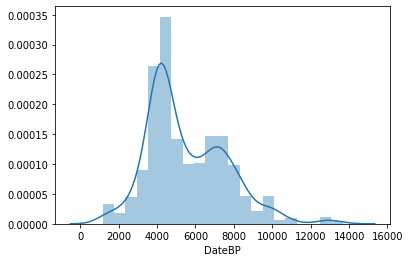

In [99]:
sns.distplot(df['DateBP'])

In [108]:
X = df.iloc[:,2:-1]
y = df['DateBP']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42,shuffle=True)

In [109]:
from sklearn import metrics
from sklearn.model_selection import cross_val_score

def cross_val(model):
    pred = cross_val_score(model, X, y, cv=10)
    return pred.mean()

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')
    
def evaluate(true, predicted):
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    return mae, mse, rmse, r2_square

## Preparing Data For Linear Regression
Linear regression is been studied at great length, and there is a lot of literature on how your data must be structured to make best use of the model.

As such, there is a lot of sophistication when talking about these requirements and expectations which can be intimidating. In practice, you can uses these rules more as rules of thumb when using Ordinary Least Squares Regression, the most common implementation of linear regression.

Try different preparations of your data using these heuristics and see what works best for your problem.

- Linear Assumption. Linear regression assumes that the relationship between your input and output is linear. It does not support anything else. This may be obvious, but it is good to remember when you have a lot of attributes. You may need to transform data to make the relationship linear (e.g. log transform for an exponential relationship).

- Remove Noise. Linear regression assumes that your input and output variables are not noisy. Consider using data cleaning operations that let you better expose and clarify the signal in your data. This is most important for the output variable and you want to remove outliers in the output variable (y) if possible.

- Remove Collinearity. Linear regression will over-fit your data when you have highly correlated input variables. Consider calculating pairwise correlations for your input data and removing the most correlated.

- Gaussian Distributions. Linear regression will make more reliable predictions if your input and output variables have a Gaussian distribution. You may get some benefit using transforms (e.g. log or BoxCox) on you variables to make their distribution more Gaussian looking.

- Rescale Inputs: Linear regression will often make more reliable predictions if you rescale input variables using standardization or normalization.

In [110]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('std_scalar', StandardScaler())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [111]:
lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train,y_train)

LinearRegression(normalize=True)

In [112]:
# print the intercept
print(lin_reg.intercept_)

5538.924170617063


In [116]:
coeff_df = pd.DataFrame(lin_reg.coef_, X.columns, columns=['Coefficient'])
coeff_df

,Coefficient
AncientComponent1,2.338561e+07
AncientComponent2,1.857542e+07
AncientComponent3,1.737305e+07
AncientComponent4,2.026071e+07
AncientComponent5,1.225160e+07
ModernComponent1,1.833200e+06
ModernComponent2,2.086580e+07
ModernComponent3,5.427727e+06


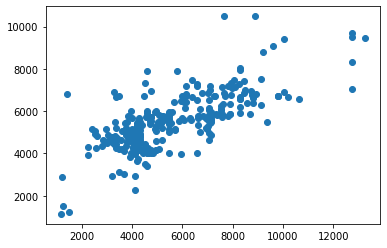

In [117]:
pred = lin_reg.predict(X_test)
plt.scatter(y_test, pred)

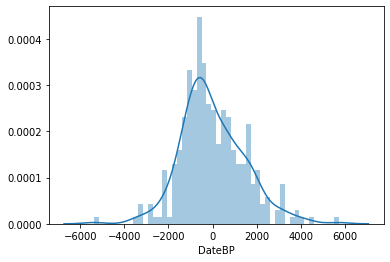

In [118]:
sns.distplot((y_test - pred), bins=50);

In [121]:
test_pred = lin_reg.predict(X_test)
train_pred = lin_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 1125.4576104871167
MSE: 2090430.4817831994
RMSE: 1445.8321070522675
R2 Square 0.5191918658490481
__________________________________
Train set evaluation:
_____________________________________
MAE: 1151.9165298247533
MSE: 2203010.142750969
RMSE: 1484.254069474283
R2 Square 0.4839806695737977
__________________________________


# random forest

In [122]:
from sklearn.ensemble import RandomForestRegressor

rf_reg = RandomForestRegressor(n_estimators=1000)
rf_reg.fit(X_train, y_train)

test_pred = rf_reg.predict(X_test)
train_pred = rf_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)

print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)


Test set evaluation:
_____________________________________
MAE: 757.6807937856481
MSE: 1384744.0651559925
RMSE: 1176.7514882743903
R2 Square 0.681502821525874
__________________________________
Train set evaluation:
_____________________________________
MAE: 301.6469851644449
MSE: 222120.06761816272
RMSE: 471.2961570161195
R2 Square 0.9479719832685747
__________________________________


# outlier detection

In [123]:
from scipy.stats import zscore
df["DateBP_zscore"] = zscore(df["DateBP"])
df["is_outlier"] = df["DateBP_zscore"].apply(lambda x: x <= -2.5 or x >= 2.5)
df[df["is_outlier"]]

,ID,Country,AncientComponent1,AncientComponent2,AncientComponent3,AncientComponent4,AncientComponent5,ModernComponent1,ModernComponent2,ModernComponent3,DateBP,DateBP_zscore,is_outlier
931,I5244,Serbia,0.070363,0.065592,0.006615,0.490220,0.019852,0.012262,0.320897,0.014199,10785.0,2.539512,True
932,I1293,Iran,0.000010,0.000010,0.999930,0.000010,0.000010,0.000010,0.000010,0.000010,10800.0,2.546750,True
933,I5240,Serbia,0.053602,0.054265,0.008618,0.486316,0.022773,0.017681,0.349125,0.007619,10805.0,2.549162,True
934,I5235,Serbia,0.078295,0.097676,0.000010,0.493084,0.001016,0.015565,0.305477,0.008877,10835.0,2.563636,True
935,I5241,Serbia,0.078653,0.057138,0.000010,0.497945,0.016620,0.018718,0.315225,0.015692,11196.0,2.737812,True
936,I0861,Israel,0.986387,0.000010,0.000010,0.000010,0.000010,0.013553,0.000010,0.000010,12750.0,3.487586,True
937,I1069,Israel,0.809513,0.000010,0.190427,0.000010,0.000010,0.000010,0.000010,0.000010,12750.0,3.487586,True
938,I1072,Israel,0.938740,0.018318,0.000010,0.012961,0.006614,0.012350,0.001940,0.009067,12750.0,3.487586,True
939,I1685,Israel,0.580089,0.000010,0.419851,0.000010,0.000010,0.000010,0.000010,0.000010,12750.0,3.487586,True
940,I1690,Israel,0.114526,0.000010,0.885414,0.000010,0.000010,0.000010,0.000010,0.000010,12750.0,3.487586,True


In [126]:
df2 = df[df["is_outlier"]==False]
X = df2.iloc[:,2:-1]
y = df2['DateBP']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42,shuffle=True)
pipeline = Pipeline([    ('std_scalar', StandardScaler())])
X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

rf_reg = RandomForestRegressor(n_estimators=1000)
rf_reg.fit(X_train, y_train)
test_pred = rf_reg.predict(X_test)
train_pred = rf_reg.predict(X_train)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 10.760288961039
MSE: 426.2212496331165
RMSE: 20.645126534684074
R2 Square 0.9998832030632155
__________________________________
Train set evaluation:
_____________________________________
MAE: 4.0380433386837815
MSE: 126.36240411476706
RMSE: 11.241103331736038
R2 Square 0.9999654636170113
__________________________________
